In [1]:
import pickle
with open('/home/z5297792/UNSW-MRes/MRes/Climatology/ROMS_26yr_daydic.pkl', 'rb') as file:
    daydic = pickle.load(file)

with open('/home/z5297792/UNSW-MRes/MRes/Climatology/ROMS_26yr_eddies.pkl', 'rb') as file:
    eddies = pickle.load(file)

with open('/srv/scratch/z5297792/Sample/frontier_sample_data.pkl', 'rb') as file:
    sample_data = pickle.load(file)
the_frontier_eddies = list(sample_data.keys())

In [2]:
import netCDF4 as nc
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
import time

fname = '/srv/scratch/z3533156/26year_BRAN2020/outer_avg_01461.nc'
dataset = nc.Dataset(fname)
lon_rho  = dataset.variables['lon_rho'][:]
lon_rho = np.transpose(lon_rho, axes=(1, 0))
lat_rho  = dataset.variables['lat_rho'][:]
lat_rho = np.transpose(lat_rho, axes=(1, 0))
z_r = np.load('/home/z5297792/UNSW-MRes/MRes/z_r/z_r.npy')
z_r = np.transpose(z_r, (1, 2, 0))

import re
def extract_number(s):
    match = re.search(r'\d+', s)
    return int(match.group()) if match else None

In [3]:
def nencioli(u, v, lon, lat, a, b): #,var
    borders = max(a, b) + 1
    vel = np.sqrt(u**2 + v**2)
    eddy_uv, eddy_c, eddy = np.zeros((0, 2)), np.zeros((0, 2)), np.zeros((0, 3))
    bound = vel.shape
    for i in range(borders, len(v) - borders + 1):
        wrk = v[i, :]  # Latitudinal section of v
        s = np.sign(wrk)
        indx = np.where(np.diff(s) != 0)[0]
        indx = indx[(indx >= borders) & (indx < len(wrk) - borders)]
        for ii in indx:
            var = 0  # Eddy type (0 = no eddy, 1 = cyclonic, -1 = anticyclonic)
            if wrk[ii] >= 0:  # Anticyclonic
                if wrk[ii - a] > wrk[ii] and wrk[ii + 1 + a] < wrk[ii + 1]:
                    var = -1
            elif wrk[ii] < 0:  # Cyclonic
                if wrk[ii - a] < wrk[ii] and wrk[ii + 1 + a] > wrk[ii + 1]:
                    var = 1
            # Second constraint: u component reversal
            if var != 0:
                if var == -1:
                    if (u[i - a, ii] <= 0 and u[i - a, ii] <= u[i - 1, ii] and
                        u[i + a, ii] >= 0 and u[i + a, ii] >= u[i + 1, ii]):
                        eddy_uv = np.vstack([eddy_uv, [lat[i, ii], lon[i, ii]], [lat[i, ii + 1], lon[i, ii + 1]]])
                    else:
                        var = 0
                elif var == 1:
                    if (u[i - a, ii] >= 0 and u[i - a, ii] >= u[i - 1, ii] and
                        u[i + a, ii] <= 0 and u[i + a, ii] <= u[i + 1, ii]):
                        eddy_uv = np.vstack([eddy_uv, [lat[i, ii], lon[i, ii]], [lat[i, ii + 1], lon[i, ii + 1]]])
                    else:
                        var = 0
                # Third constraint: velocity minimum
                if var != 0:
                    srch = vel[i - b:i + b, ii - b:ii + b + 1]
                    slat = lat[i - b:i + b, ii - b:ii + b + 1]
                    slon = lon[i - b:i + b, ii - b:ii + b + 1]
                    X, Y = np.unravel_index(np.argmin(srch), srch.shape)
                    srch2 = vel[max(i - b + X - 1 - b, 0):min(i - b + X - 1 + b, bound[0]),
                                max(ii - b + Y - 1 - b, 0):min(ii - b + Y - 1 + b, bound[1])]
                    if np.min(srch2) == np.min(srch):
                        eddy_c = np.vstack([eddy_c, [slat[X, Y], slon[X, Y]]])
                    else:
                        var = 0
                # Fourth constraint: vector rotation (simplified version)
                d = a - 1
                if var != 0:
                    i1, i2 = np.where((lat == slat[X, Y]) & (lon == slon[X, Y]))
                    i1, i2 = int(i1[0]), int(i2[0])
                    u_small = u[max(i1 - d, 0):min(i1 + d, bound[0]), max(i2 - d, 0):min(i2 + d, bound[1])]
                    v_small = v[max(i1 - d, 0):min(i1 + d, bound[0]), max(i2 - d, 0):min(i2 + d, bound[1])]
                    if not np.isnan(u_small).any():
                        u_bound = np.concatenate([u_small[0, :], u_small[1:, -1], u_small[-1, -2::-1], u_small[-2::-1, 0]])
                        v_bound = np.concatenate([v_small[0, :], v_small[1:, -1], v_small[-1, -2::-1], v_small[-2::-1, 0]])
                        quadrants = np.zeros_like(u_bound)
                        quadrants[(u_bound >= 0) & (v_bound >= 0)] = 1
                        quadrants[(u_bound < 0) & (v_bound >= 0)] = 2
                        quadrants[(u_bound < 0) & (v_bound < 0)] = 3
                        quadrants[(u_bound >= 0) & (v_bound < 0)] = 4
                        spin = np.where(quadrants == 4)[0]
                        if spin.size > 0 and spin.size != quadrants.size:
                            if spin[0] == 0:
                                spin = np.where(quadrants != 4)[0]
                                spin = spin[0] - 1
                            if not isinstance(spin, np.ndarray):
                                spin = np.array([int(spin)])
                            quadrants[spin[-1] + 1:] += 4
                            if not np.any(np.diff(quadrants) > 1) and not np.any(np.diff(quadrants) < 0):
                                eddy = np.vstack([eddy, [slat[X, Y], slon[X, Y], var]])
    eddy = np.unique(eddy, axis=0)
    eddy_uv = np.unique(eddy_uv, axis=0)
    eddy_c = np.unique(eddy_c, axis=0)
    eddy[:, 2] = -eddy[:, 2]

    return eddy_uv, eddy_c, eddy


In [4]:
def find_root(x, y):
    coefficients = np.polyfit(x, y, 3)
    polynomial = np.poly1d(coefficients)
    roots = np.roots(polynomial)

    roots = roots[np.isreal(roots)].real

    R = np.abs(x[len(x)//2] - roots)
    root = roots[np.argmin(R)]

    return root

def tang_at_root(x, y, root_x):
    coeffs = np.polyfit(x, y, 3)
    poly_derivative = np.polyder(coeffs)
    slope_at_root = np.polyval(poly_derivative, root_x)
    y_at_root = np.polyval(coeffs, root_x)
    intercept = y_at_root - slope_at_root * root_x
    
    y_fit = np.polyval(coeffs, x)
    ss_res = np.sum((y - y_fit) ** 2)
    ss_tot = np.sum((y - np.mean(y)) ** 2)
    r2 = 1 - (ss_res / ss_tot)
    
    return slope_at_root, intercept, r2

def moca(nic, njc, u, v, X, Y, r=5):
    u1, v1 = u[nic-r:nic+r+1, njc], v[nic-r:nic+r+1, njc]
    x1, y1 = X.T[nic-r:nic+r+1, njc], Y.T[nic-r:nic+r+1, njc]
    xx = x1 - X.T[nic, njc]

    u2, v2 = u[nic, njc-r:njc+r+1], v[nic, njc-r:njc+r+1]
    x2, y2 = X.T[nic, njc-r:njc+r+1], Y.T[nic, njc-r:njc+r+1]
    yy = y2 - Y.T[nic, njc]

    if np.any(np.any(np.isnan(u1)) | np.any(np.isnan(v1)) | np.any(np.isnan(u2)) | np.any(np.isnan(v2))):
        return np.nan, np.nan, np.nan

    root_x = find_root(xx, v1)
    A1, A0, r2A = tang_at_root(xx, u1, root_x)
    B1, B0, r2B = tang_at_root(xx, v1, root_x)
    
    root_y = find_root(yy, u2)
    C1, C0, r2C = tang_at_root(yy, u2, root_y)
    D1, D0, r2D = tang_at_root(yy, v2, root_y)

    alpha = A0 if r2A > r2C else C0
    beta = B0 if r2B > r2D else D0
    gamma = A1 if r2A > r2D else -D1
    q11, q12, q22 = B1 / 2, -gamma / 2, -C1 / 2

    x0 = - ( alpha*gamma + beta*C1  ) / (C1*B1+gamma**2)
    y0 = ( beta*gamma-alpha*B1  ) / (C1*B1+gamma**2)
    w = 2 * (q11 + q22)

    return x0 + X.T[nic, njc], y0 + Y.T[nic, njc], w

In [6]:
df_VG = pd.DataFrame(columns=['Eddy', 'Day', 'xc', 'yc', 'nic', 'njc', 'z', 'Depth', 'w'])
for eddy in the_frontier_eddies:

    var = 1 if eddies[eddy].iloc[0]['Vort'] < 0 else -1

    for t in range(30): 

        U = sample_data[eddy]['T'+str(t)]['U']
        V = sample_data[eddy]['T'+str(t)]['V']
        
        x, y = sample_data[eddy]['T'+str(t)]['x']/1000, sample_data[eddy]['T'+str(t)]['y']/1000
        X, Y, dx = *np.meshgrid(x, y), x[1]-x[0]

        xc_pre, yc_pre = 0, 0
        for depth_lvl in range(22):

            u, v = U[:, :, depth_lvl], V[:,:, depth_lvl]
            
            neddy = nencioli(u.T, v.T, X, Y, 4, 3)[2]
            neddy = neddy[neddy[:, 2] == var]
            if len(neddy[:, 1]) > 1:
                R = np.hypot(xc_pre - neddy[:, 1], yc_pre - neddy[:, 0])
                neddy = neddy[R == np.nanmin(R)]
            elif len(neddy[:, 1]) == 0:
                break
            nxc, nyc = neddy[0, 1], neddy[0, 0]
            nic, njc = np.where(nxc == x)[0][0], np.where(nyc == y)[0][0]
    
            xc, yc, w = moca(nic, njc, u, v, X, Y)
            if not np.isnan(xc):
                R = np.hypot(xc - xc_pre, yc - yc_pre)
                if R < 50:
                    df_VG.loc[len(df_VG)] = {'Eddy': eddy, 'Day': t, 'xc': xc, 'yc': yc, 'nic': nic, 'njc': njc, 'z': depth_lvl, 'Depth': z_r[150, 150, depth_lvl], 'w': w}
                    xc_pre, yc_pre = xc, yc
                else:
                    break
            else:
                break

In [8]:
df_VG

,Eddy,Day,xc,yc,nic,njc,z,Depth,w
0,Eddy790,0,7.156021,-0.785362,51,49,0,-1.783320,0.037221
1,Eddy790,0,6.372685,0.285363,51,49,1,-5.879627,0.036798
2,Eddy790,0,5.809128,0.756879,51,49,2,-10.725783,0.036525
3,Eddy790,0,5.197180,1.021586,51,49,3,-16.383097,0.036318
4,Eddy790,0,4.519395,0.650171,50,49,4,-22.925581,0.035961
...,...,...,...,...,...,...,...,...,...
2603,Eddy775,29,6.602741,-2.699767,51,48,17,-327.440851,-0.009104
2604,Eddy775,29,7.372296,-2.610774,52,48,18,-407.922192,-0.008431
2605,Eddy775,29,7.838394,-2.315951,52,48,19,-515.416489,-0.007775
2606,Eddy775,29,7.858435,-1.194520,51,49,20,-660.806374,-0.007017


In [83]:
df_MOCA = pd.DataFrame(columns=['Eddy', 'Day', 'xc', 'yc', 'nic', 'njc', 'z', 'Depth', 'w'])
for eddy in the_frontier_eddies:

    var = 1 if eddies[eddy].iloc[0]['Vort'] > 0 else -1 # 1 for anti-cyclone

    for t in range(30): 

        U = sample_data[eddy]['T'+str(t)]['U']
        V = sample_data[eddy]['T'+str(t)]['V']
        
        x, y = sample_data[eddy]['T'+str(t)]['x']/1000, sample_data[eddy]['T'+str(t)]['y']/1000
        X, Y, dx = *np.meshgrid(x, y), x[1]-x[0]

        xc_pre, yc_pre = 0, 0
        nic, njc = u.shape[0]//2, u.shape[1]//2
        r = 5
        for depth_lvl in range(22):

            if not (r <= nic < u.shape[0] - r and r <= njc < u.shape[1] - r):
                break

            u, v = U[:, :, depth_lvl], V[:,:, depth_lvl]
    
            xc, yc, w = moca(nic, njc, u, v, X, Y, r)
            if not np.isnan(xc) and np.sign(var) == np.sign(w):
                R = np.hypot(xc - xc_pre, yc - yc_pre)
                if R < 50:
                    df_MOCA.loc[len(df_MOCA)] = {'Eddy': eddy, 'Day': t, 'xc': xc, 'yc': yc, 'nic': nic, 'njc': njc, 'z': depth_lvl, 'Depth': z_r[150, 150, depth_lvl], 'w': w}
                    xc_pre, yc_pre = xc, yc

                    nic = np.abs(x - xc).argmin()
                    njc = np.abs(y - yc).argmin()
                    
                else:
                    break
            else:
                break

In [82]:
df_MOCA

,Eddy,Day,xc,yc,nic,njc,z,Depth,w
0,Eddy790,0,7.133481,-0.581158,49,49,0,-1.783320,0.037167
1,Eddy790,0,6.372685,0.285363,51,49,1,-5.879627,0.036798
2,Eddy790,0,5.809128,0.756879,51,49,2,-10.725783,0.036525
3,Eddy790,0,5.197180,1.021586,51,49,3,-16.383097,0.036318
4,Eddy790,0,4.551339,1.080637,51,49,4,-22.925581,0.036093
...,...,...,...,...,...,...,...,...,...
2587,Eddy775,29,6.602741,-2.699767,51,48,17,-327.440851,-0.009104
2588,Eddy775,29,7.370661,-2.612763,51,48,18,-407.922192,-0.008455
2589,Eddy775,29,7.846575,-2.327410,51,48,19,-515.416489,-0.007763
2590,Eddy775,29,7.859626,-1.187249,52,48,20,-660.806374,-0.006939


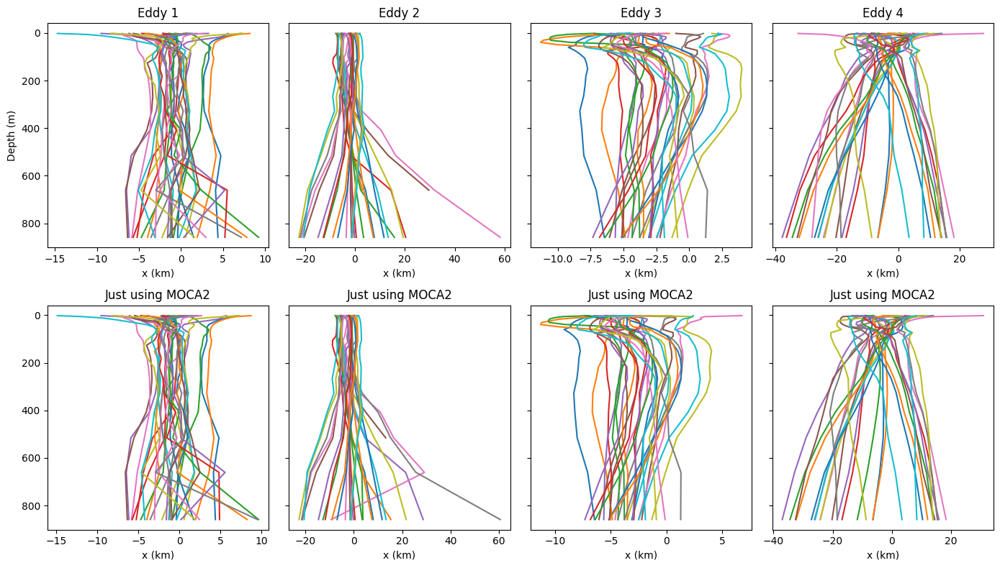

In [74]:
fig, axs = plt.subplots(2, 4, figsize=(14,8), sharey=True)

for i, eddy in enumerate(the_frontier_eddies):

    for t in range(0, 30):
    
        df = df_VG[(df_VG['Eddy']==eddy) & (df_VG['Day']==t)]
        axs[0, i].plot(df['xc'], -df['Depth'])

        df = df_MOCA[(df_MOCA['Eddy']==eddy) & (df_MOCA['Day']==t)]
        axs[1, i].plot(df['xc'], -df['Depth'])
        
    axs[0, i].set_title(f'Eddy {i+1}')

    axs[1, i].set_title('Just using MOCA2')
    
    axs[0, i].set_xlabel('x (km)')
    axs[1, i].set_xlabel('x (km)')
axs[0,0].set_ylabel('Depth (m)')
axs[0,0].set_ylabel('Depth (m)')
axs[0,0].invert_yaxis()

plt.tight_layout()
plt.show()


### Plotting

In [62]:
eddy1 = [the_frontier_eddies[0]] * 3 
t1 = [0, 5, 15, 25, 29]
z1 = [3, 0, 3, 20, 0]

eddy2 = [the_frontier_eddies[1]] * 9
t2 = [0, 10, 10, 10, 10, 20, 29]
z2 = [20, 3, 15, 20, 5, 5, 20]

eddy3 = [the_frontier_eddies[2]] * 14
t3 = [0, 5, 10, 10, 15, 15, 15, 25, 25, 25, 25, 25, 29, 29]
z3 = [5, 0, 5, 15, 0, 3, 9, 0, 3, 9, 15, 20, 15, 20]

eddy4 = [the_frontier_eddies[3]] * 10
t4 = [0, 0, 0, 5, 10, 10, 15, 20, 20, 29]
z4 = [5, 8, 20, 20, 3, 20, 20, 8, 20, 20]

df_show_offs = pd.DataFrame({
    'Eddy': eddy1 + eddy2 + eddy3 + eddy4,
    'Day': t1 + t2 + t3 + t4,
    'z': z1 + z2 + z3 + z4
    })

df_show_offs

,Eddy,Day,z
0,Eddy790,0,3
1,Eddy790,5,0
2,Eddy790,15,3
3,Eddy110,25,20
4,Eddy110,29,0
5,Eddy110,0,20
6,Eddy110,10,3
7,Eddy110,10,15
8,Eddy110,10,20
9,Eddy110,10,5


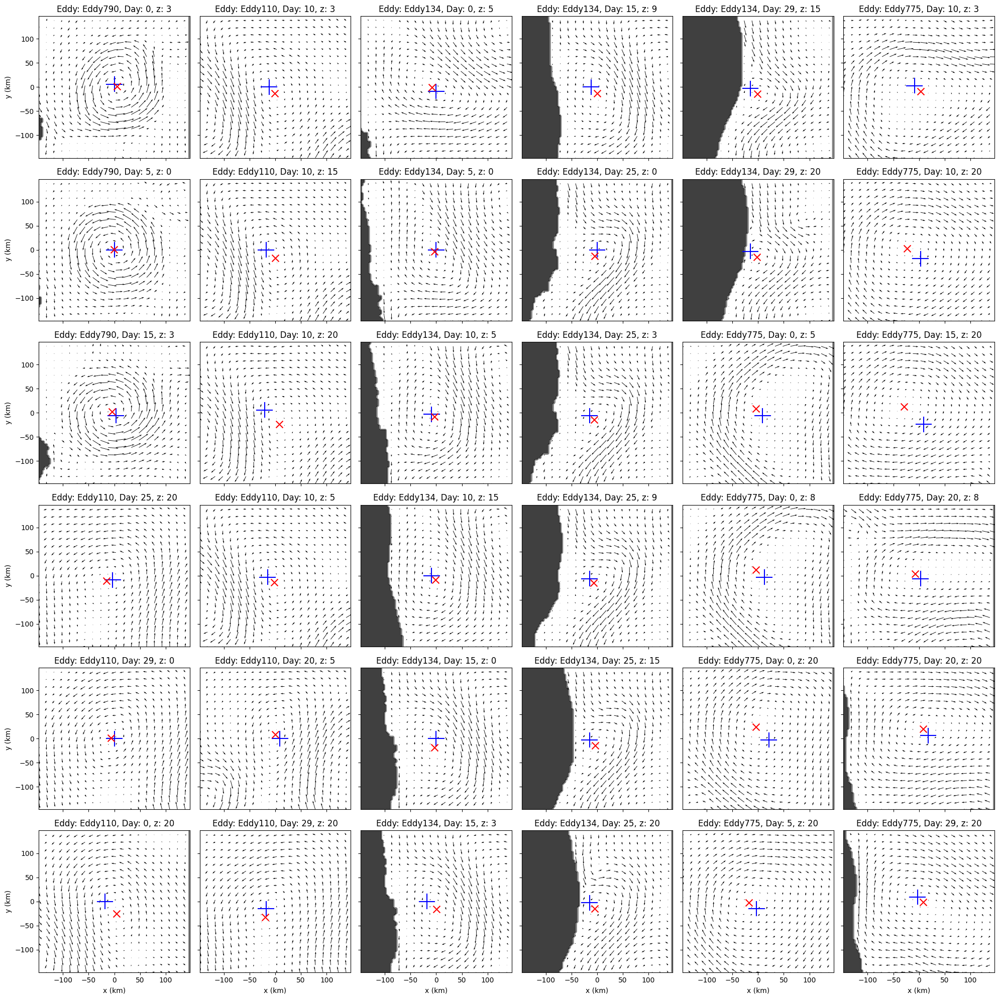

In [78]:
rows, cols = 6, 6

fig, axs = plt.subplots(rows, cols, figsize=(20, 20), sharey=True, sharex=True)

for k in range(len(df_show_offs)):

    ax = axs[k % rows, k//rows]

    df_rel = df_show_offs.iloc[k]
    eddy, t, depth_lvl = df_rel['Eddy'], df_rel['Day'], df_rel['z']

    u = sample_data[eddy]['T'+str(t)]['U'][:, :, depth_lvl]
    v = sample_data[eddy]['T'+str(t)]['V'][:, :, depth_lvl]
    
    x, y = sample_data[eddy]['T'+str(t)]['x']/1000, sample_data[eddy]['T'+str(t)]['y']/1000
    X, Y, dx = *np.meshgrid(x, y), x[1]-x[0]
    
    spacing = 5
    ax.quiver(X[::spacing, ::spacing], Y[::spacing, ::spacing], u[::spacing, ::spacing].T, v[::spacing, ::spacing].T)

    df_rel = df_MOCA[(df_MOCA['Eddy']==eddy) & (df_MOCA['Day']==t) & (df_MOCA['z']==depth_lvl)]

    xc, yc, nic, njc, depth, w = df_rel['xc'], df_rel['yc'], df_rel['nic'], df_rel['njc'], df_rel['Depth'], df_rel['w']

    ax.plot([X[nic-r, njc], X[nic+r, njc]], [Y[nic-r, njc], Y[nic+r, njc]], 'b', zorder=3)
    ax.plot([X[nic, njc-r], X[nic, njc+r]], [Y[nic, njc-r], Y[nic, njc+r]], 'b', zorder=3)
    
    ax.scatter(xc, yc, marker='x', s=100, color='r', zorder=4)

    if np.any(np.isnan(u)):
        nan_mask = np.isnan(u)
        mask = np.where(~np.isnan(u), np.nan, 0)
        ax.contourf(X, Y, mask.T, cmap='gray', zorder=-1)
        ax.contour(X, Y, nan_mask.T, colors='k', linewidths=2, alpha=.5)

    ax.set_title(f'Eddy: {eddy}, Day: {t}, z: {depth_lvl}')
    
    if k % rows == rows - 1:
        ax.set_xlabel('x (km)')
    if k < rows:
        ax.set_ylabel('y (km)')

    # ax.axis('equal')

plt.tight_layout()
plt.show()

In [ ]:
break

In [30]:
def plotter(eddy, t, depth_lvl):
    fig = plt.figure(figsize=(4,4))
    u = sample_data[eddy]['T'+str(t)]['U'][:, :, depth_lvl]
    v = sample_data[eddy]['T'+str(t)]['V'][:, :, depth_lvl]
    
    x, y = sample_data[eddy]['T'+str(t)]['x']/1000, sample_data[eddy]['T'+str(t)]['y']/1000
    X, Y, dx = *np.meshgrid(x, y), x[1]-x[0]
    
    spacing = 5
    plt.quiver(X[::spacing, ::spacing], Y[::spacing, ::spacing], u[::spacing, ::spacing].T, v[::spacing, ::spacing].T)

    df_rel = df_MOCA[(df_MOCA['Eddy']==eddy) & (df_MOCA['Day']==t) & (df_MOCA['z']==depth_lvl)]

    xc, yc, nic, njc, depth, w = df_rel['xc'], df_rel['yc'], df_rel['nic'], df_rel['njc'], df_rel['Depth'], df_rel['w']

    plt.plot([X[nic-r, njc], X[nic+r+1, njc]], [Y[nic-r, njc], Y[nic+r+1, njc]], 'r')
    plt.plot([X[nic, njc-r], X[nic, njc+r+1]], [Y[nic, njc-r], Y[nic, njc+r+1]], 'r')
    
    plt.scatter(xc, yc, marker='x', s=100, color='r')

    plt.title(f'Eddy: {eddy}, Day: {t}, z: {depth_lvl}')


/scratch/pbs.6255083.kman.restech.unsw.edu.au/ipykernel_2782627/3966841335.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(4,4))


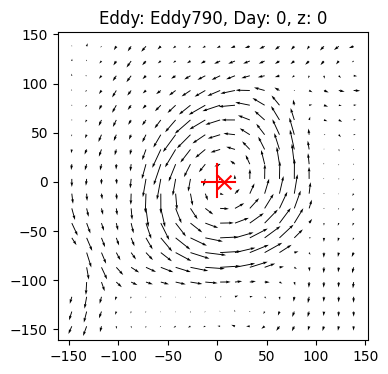

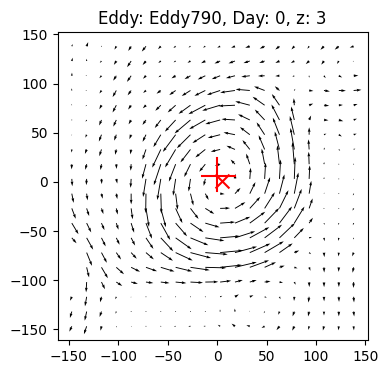

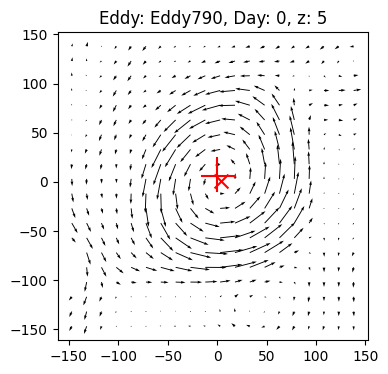

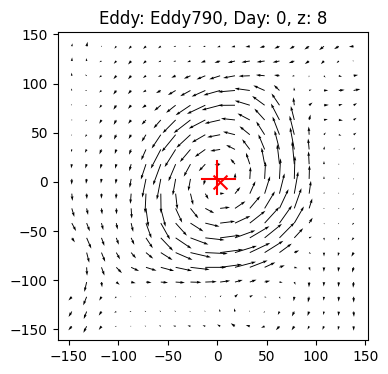

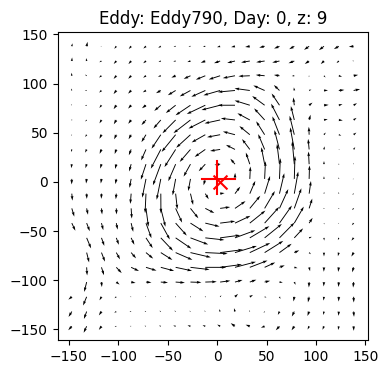

...

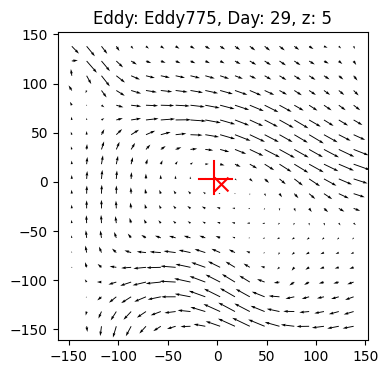

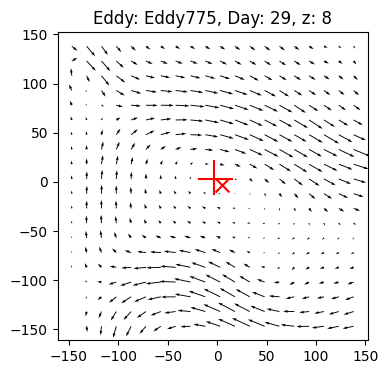

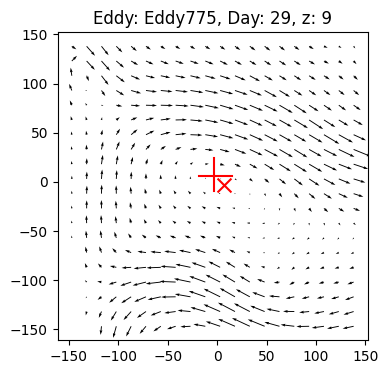

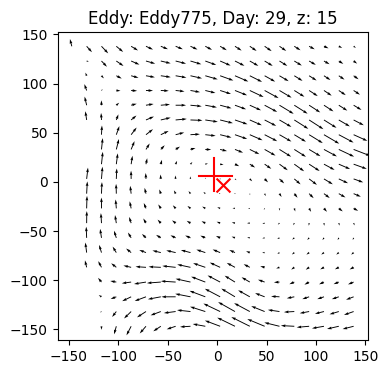

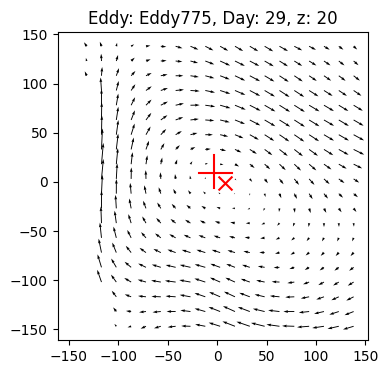

In [31]:
for eddy in the_frontier_eddies:
    for t in [0, 5, 10, 15, 20, 25, 29]:
        for depth_lvl in [0, 3, 5, 8, 9, 15, 20]:

            plotter(eddy, t, depth_lvl)